# Traffic Sign Classification Project 
### Dataset: {G}erman {T}raffic {S}ign {R}ecognition {B}enchmark (GTSRB)

#### I would like to use CNN to preprocess images
![title](images/CNN.webp)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2  # For image processing
import os
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers # type: ignore

C:\Users\josua\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\export\tf2onnx_lib.py:8: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  if not hasattr(np, "object"):


Firstly I want to have a look at the dataset. This will help me get a basic undertsanding of the data and its structure.

 The GTSRB dataset contains images of traffic signs captured in various conditions, including different lighting and weather scenarios. The dataset is divided into training and testing sets, with each image labeled according to the type of traffic sign it represents.

In [7]:
import pandas as pd
signnames = pd.read_csv("/Users/josua/Documents/Projects/Traffic Sign Classification/DATA/signnames.csv")

In the following step I will group the traffic signs into categories based on their function or appearance. This grouping will help in simplifying the classification task and improving the model's performance. The catergories are taken from the Meta Folder of the dataset.

![title](images/schilder_gruppen.png)

In [5]:
prohibitory = [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 15, 16] #(circular, white ground with red border)
mandatory = [33, 34, 35, 36, 37, 38, 39, 40] #(circular, blue ground)
danger = [11, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31] #(triangular, white ground with red border)
print(f"prohibitory: {prohibitory}")
print(f"mandatory: {mandatory}")
print(f"danger: {danger}")

prohibitory: [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 15, 16]
mandatory: [33, 34, 35, 36, 37, 38, 39, 40]
danger: [11, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]


Now I will go through all Classes and plot some examples to get an idea of what the signs look like.

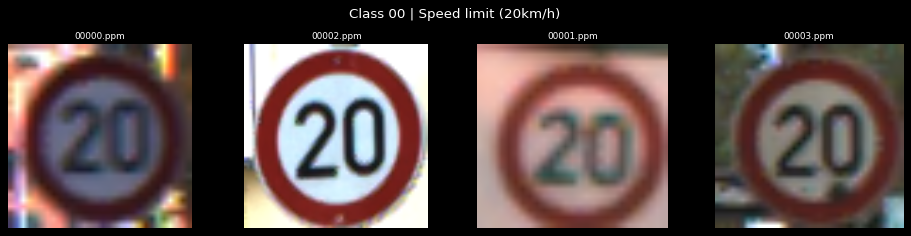

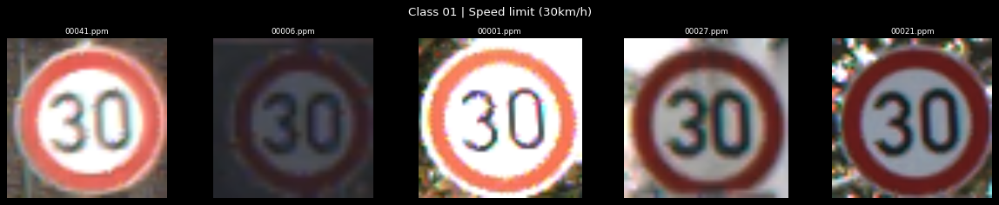

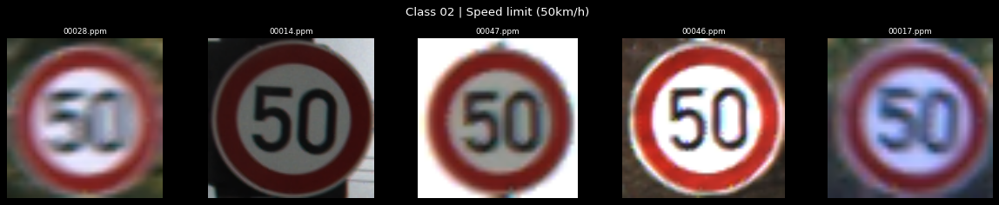

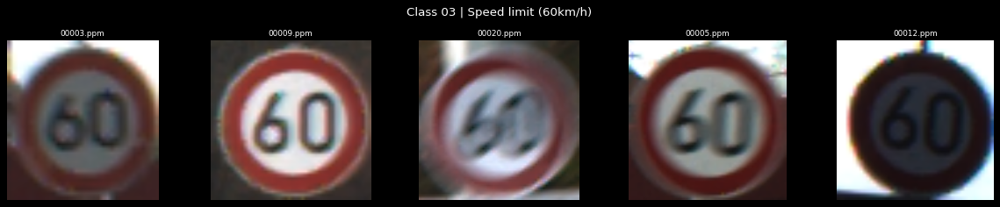

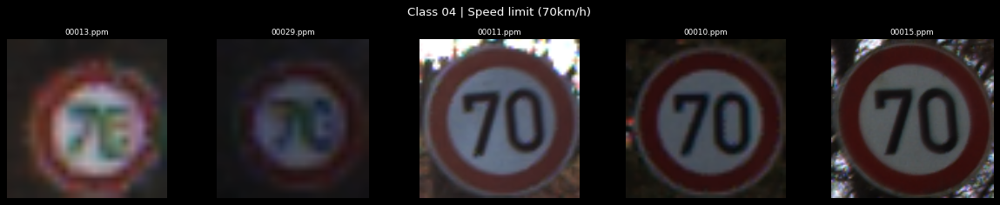

...

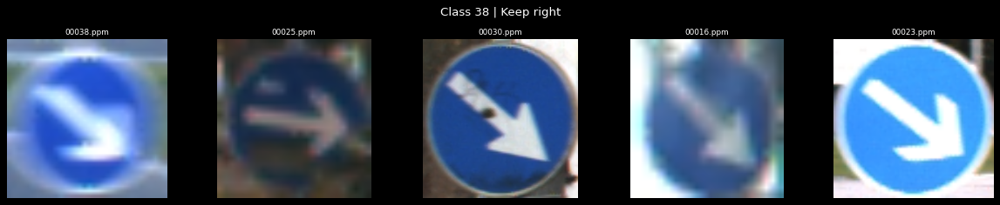

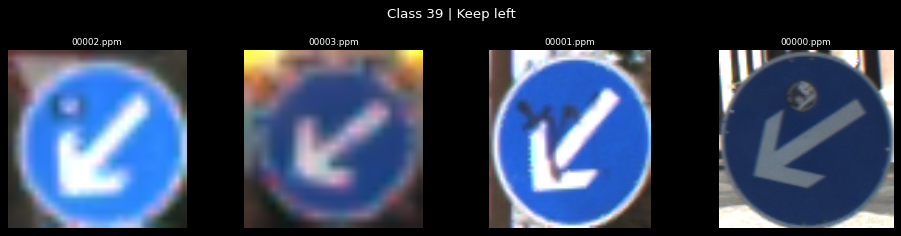

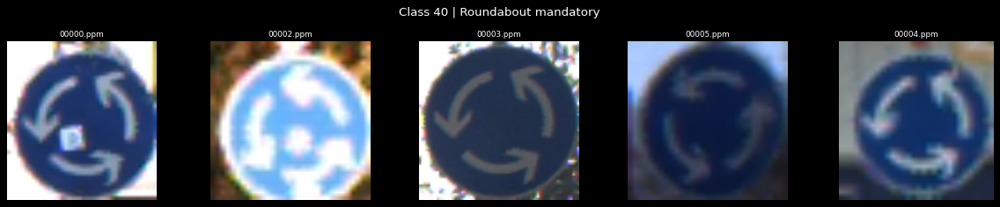

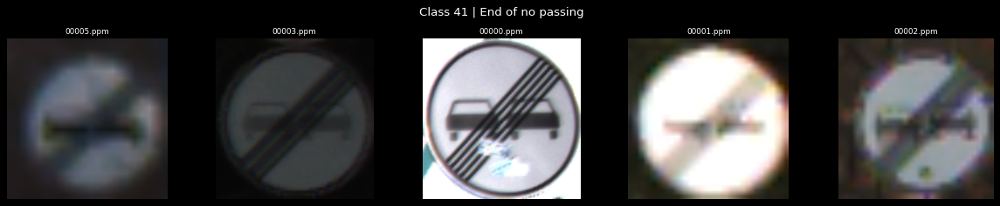

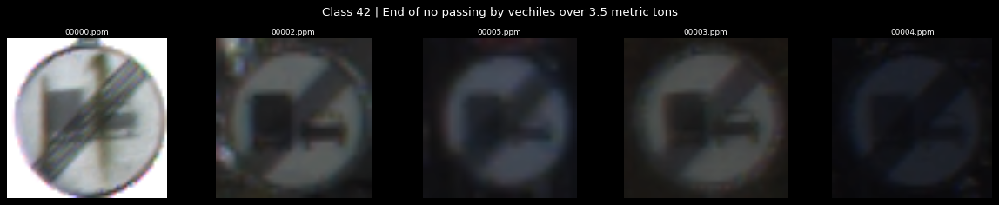

In [ ]:
from pathlib import Path
import random
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.image import imread

plt.style.use("dark_background")

examples_root = Path("GTSRB/Train")
label_map = pd.read_csv("signnames.csv").set_index("ClassId")['SignName'].to_dict()
class_dirs = sorted(examples_root.glob("[0-9][0-9]"), key=lambda p: int(p.name))

for idx, class_dir in enumerate(class_dirs, 1):
    imgs = sorted(class_dir.glob("*.ppm"))
    if not imgs:
        continue
    chosen = random.sample(imgs, min(5, len(imgs)))
    fig, axes = plt.subplots(1, len(chosen), figsize=(3 * len(chosen), 3))
    axes = [axes] if len(chosen) == 1 else axes
    fig.suptitle(f"Class {class_dir.name} | {label_map.get(int(class_dir.name), 'unknown')}")
    for ax, path in zip(axes, chosen):
        ax.imshow(imread(path))
        ax.set_title(path.name, fontsize=8)
        ax.axis("off")
        ax.set_facecolor("black")
    fig.patch.set_facecolor("black")
    plt.tight_layout()
    plt.show()

### Main takeaways:

- The image files all have different sizes. This will need to be handled during preprocessing.
- Some classes have significantly more examples than others, which could lead to class imbalance issues during training.

Now I want to see how many images there are per class as they seem to be really imbalanced.

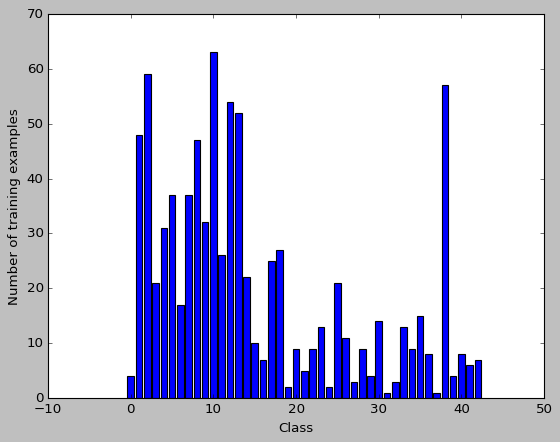

In [22]:
plt.style.use("classic")

train_root = Path("DATA/GTSDB/Train")
class_counts = np.array([len(list((train_root / f"{i:02d}").glob("*.ppm"))) for i in range(43)])

plt.bar(np.arange(43), class_counts)
plt.xlabel('Class')
plt.ylabel('Number of training examples')
plt.show()

Some classes seem to have very few images. This could be a problem for training a model. I might need to augment the data for these classes or consider merging some classes together.

- 19: Dangerous curve to the left <img src="images/Dangerous curve to the left.webp" alt="Dangerous curve to the left" style="width:100px; display:block;"/> 
- 24: Road narrows to the right <img src="images/road_narrows_right.png" alt="Road narrows to the right" style="width:100px; display:block;"/>
- 31: Wild animals crossing <img src="images/wild_animals_crossing.png" alt="Wild animals crossing" style="width:100px; display:block;"/>
- 37: Go straight or left <img src="images/go_straight_left.png" alt="Go straight or left" style="width:100px; display:block;"/>

Now that I have a basic understanding of the dataset, I can proceed with data loading and preprocessing.